<a href="https://colab.research.google.com/github/yonatanlou/study_projects/blob/main/Statistics_lab/labs/Lab5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Import modules 
import numpy as np
import pandas as pd 
import statsmodels.api as sm 
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import statsmodels.api as sm
from functools import partialmethod

import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import Normalizer

pd.DataFrame.head = partialmethod(pd.DataFrame.head, n=10)

import random
random.seed(42)


pd.get_option("display.max_columns")

from IPython.display import display

In [ ]:
parties_dict ={'אמת': 'עבודה',
 'ב': 'ימינה',
 'ג': 'יהדות התורה',
 'ודעם': 'הרשימה המשותפת',
 'ט': 'הציונות הדתית',
 'כן': 'כחול לבן',
 'ל': 'ישראל ביתנו',
 'מחל': 'הליכוד',
 'מרצ': 'מרצ',
 'עם': 'רעם',
 'פה': 'יש עתיד',
 'שס': 'שס',
 'ת': 'תקוה חדשה'}
##relevant 13 parties

In [ ]:
data_url = "https://raw.githubusercontent.com/yonatanlou/study_projects/main/Statistics_lab/votes_per_ballot_2021.csv"
votes_per_ballot = pd.read_csv(data_url,  encoding = 'iso-8859-8', index_col='שם ישוב')

df = votes_per_ballot
df = df.iloc[:,:-1]
df = df.loc[~df.index.str.fullmatch('מעטפות חיצוניות')]
df.head()

,סמל ועדה,ברזל,סמל ישוב,קלפי,ריכוז,שופט,בזב,מצביעים,פסולים,כשרים,אמת,ב,ג,ודעם,ז,זץ,ט,י,יז,ינ,יף,יק,יר,כ,כך,כן,ל,מחל,מרצ,נ,ני,נר,עם,פה,ףז,צי,צכ,צף,ץ,ק,קי,קך,קץ,ר,רנ,רף,רק,שס,ת
שם ישוב,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
אבירים,6,3238,1220,1.0,1,0,221,151,1,150,47,0,0,3,0,0,2,0,3,0,0,0,0,0,0,16,2,5,31,0,0,0,0,27,0,0,0,0,0,0,0,0,0,5,0,0,0,1,8
אדירים,5,1788,113,1.0,1,0,234,180,0,180,1,7,4,0,0,0,9,0,1,0,0,0,0,0,0,3,0,84,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,2,0,0,0,61,6
אושה,8,4113,278,1.0,1,0,382,276,0,276,72,7,0,3,0,0,0,0,2,0,0,1,0,0,0,37,8,24,20,0,0,0,0,86,0,0,0,0,0,0,0,0,0,1,0,0,0,0,15
אחווה,17,10449,1157,1.0,1,0,183,145,0,145,14,4,0,0,0,0,4,0,0,0,0,0,0,0,0,36,3,27,10,0,0,0,0,37,0,0,0,0,0,0,0,0,0,0,0,0,0,2,8
איבים,17,10450,338,1.0,1,0,138,40,0,40,0,4,0,0,0,1,10,0,0,0,0,0,0,0,0,5,0,17,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
אלעריאן,9,4332,1316,1.0,3,0,130,84,0,84,0,0,0,48,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,32,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
אלומות,4,1553,330,1.0,1,0,316,205,0,205,45,12,1,0,0,0,2,0,2,0,0,0,0,0,0,26,3,24,31,0,0,0,0,49,0,0,0,0,0,0,0,0,0,0,0,0,0,1,9
אלוני יצחק,9,4798,868,1.0,2,0,125,23,0,23,5,1,0,0,0,0,0,0,1,0,0,0,0,0,0,3,0,1,0,0,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6
אליעד,4,1613,4002,1.0,1,0,311,222,3,219,46,21,0,0,0,0,8,0,1,0,0,0,0,0,0,27,12,18,11,0,0,0,0,54,1,0,0,0,0,0,0,0,0,3,0,0,0,0,17


Data preperation

In [ ]:
df = df.loc[~df.index.str.fullmatch('מעטפות חיצוניות')]
col_index = [6]+list(range(10,df.shape[1]))
df_model = df.iloc[:,col_index]

## Q1

In [ ]:
def OLS_lab5(df, votes_ratio):
    probs = df.sum().div(df.sum().sum())  #probs by party
    bzb = df.sum(axis=1)/votes_ratio #bzb ratio by party
    df['שם ישוב'] = df.index
    alpha = pd.get_dummies(df['שם ישוב'])*df.sum(axis=1).to_numpy()[:, None]
    design_matrix = pd.concat([df,alpha] ,axis=1).drop('שם ישוב', axis=1)
    model = sm.OLS(bzb, design_matrix).fit()
    b = model.params[:13]
    a = model.params[13:]
    df =df.drop('שם ישוב', axis=1)
    a_mult = df.apply(lambda row: row * a[row.name], axis=1)
    b_mult = df*b
    test = a_mult + b_mult
    q_hat_lab5 = test.sum(axis=0)/test.sum().sum()

    return q_hat_lab5 

In [ ]:
def OLS_Q1(df, votes_ratio):
    probs = df.sum().div(df.sum().sum())  #probs by party
    bzb = df.sum(axis=1)/votes_ratio #bzb ratio by party
    model = sm.OLS(bzb, df).fit()
    q_hat = probs * model.params 
    q_hat = q_hat / q_hat.sum()

    return probs, q_hat, model.params 

## Q2

In [ ]:
# Compute votes share only for parties above a certain threshold 
def parties_votes_percents(df, thresh):
    par = df.sum().div(df.sum().sum()).sort_values(ascending=False)
    print(par)
    return par[par > thresh]

total_votes = parties_votes_percents(df.iloc[:,10:], 0.0325)  # total votes for each party
names = total_votes.keys()

# update the data with the 13 parties above the certain threshold
df_2021 = df[names]

In [ ]:
def OLS_Q1(df, votes_ratio):
    probs = df.sum().div(df.sum().sum())  #probs by party
    bzb = df.sum(axis=1)/votes_ratio #bzb ratio by party
    model = sm.OLS(bzb, df).fit()
    q_hat = probs * model.params 
    q_hat = q_hat / q_hat.sum()

    return probs, q_hat, model.params 

In [ ]:
# Compute votes share only for parties above a certain threshold 
def parties_votes_percents(df, thresh):
    par = df.sum().div(df.sum().sum()).sort_values(ascending=False)
    return par[par > thresh]

total_votes = parties_votes_percents(df.iloc[:,10:], 0.0325)  # total votes for each party
names = total_votes.keys()

# update the data with the 13 parties above the certain threshold
df_2021 = df[names]

In [ ]:
#utils functions

def fixing_data(df, fix_param):
  #p = parties_votes_percents(df, 0) 
  q_hat = parties_votes_percents(df.div(fix_param, axis = "rows"), 0)
  return q_hat



def sim_data(N,V):
  new_df = pd.DataFrame(np.random.binomial(N,V))
  #generating the matrix when the N are how much voted for each party in each city,
  #after tikun of how much would probably vote if the bzb==ksherim
  new_df.index = df.index  
  
  # votes_ratio = new_df.sum(axis=1)/ N.sum(axis=1) #by party
  # return new_df, votes_ratio
  return new_df



def simulations_lab3(fix_param, iters, N, V):
  """
  fix_param = votes/bzb matrix
  iters = how many iterations
  N = round((bzb/ksherim)*(each city,party))
  V = same as fix_param but in matrix
  """
  p_mat = np.zeros([iters, len(names)])
  q_hat = np.zeros([iters, len(names)])
  q_hat_mat = np.zeros([iters, len(names)])
  q_hat_lab5 = np.zeros([iters, len(names)])

  for i in range(0,iters):
    tmp_df = sim_data(N,V)
    q_hat[i,] = fixing_data(tmp_df, fix_param)
    p_mat[i,], q_hat_mat[i,] = OLS_Q1(tmp_df, fix_param)[0:2]
    q_hat_lab5[i,] = OLS_lab5(tmp_df, fix_param)
  return p_mat, q_hat, q_hat_mat, q_hat_lab5


In [ ]:
# N~ij :
N_tilde = np.array(df_2021.mul(df['בזב'].sum()).div(df['כשרים'].sum()),dtype='int32')
# 3 types of Vi 
alpha = df['כשרים'].div(df['בזב'])
beta = [0.6,0.65,0.75,0.5,0.4,0.35,0.8,0.55,0.45,0.25,0.3,0.7,0.2]  # arbitrary ordering
beta_rndm = random.sample(beta, len(beta))

dim = df_2021.shape
# converting them to the desired shape:
V_alpha = np.tile(np.array([alpha]).transpose(), (1, len(names)))
V_beta = np.tile(np.array(beta), (dim[0],1))
V_beta_rndm = np.tile(np.array(beta_rndm), (dim[0],1))

In [ ]:
iters = 50 # number of simulations
q_real = N_tilde.sum(axis=0)/(N_tilde.sum())
sim_alpha = simulations_lab3(alpha, iters, N_tilde, V_alpha)

mean_p_alpha = sim_alpha[0].mean(axis=0)
mean_q_alpha = sim_alpha[1].mean(axis=0)
mean_q5_alpha = sim_alpha[3].mean(axis=0)

bias_q_alpha = mean_q_alpha - q_real
var_q_alpha = sim_alpha[1].var(axis=0)
mse_q_alpha = var_q_alpha + bias_q_alpha**2
mean_q_v_new = np.nanmean(sim_alpha[2],axis=0)

sim_beta = simulations_lab3(alpha, iters, N_tilde, V_beta)

mean_p_beta = sim_beta[0].mean(axis=0) 
mean_q_beta = sim_beta[1].mean(axis=0)
mean_q5_beta = sim_alpha[3].mean(axis=0) 

bias_q_beta = mean_q_beta - q_real
var_q_beta = sim_beta[1].var(axis=0)
mse_q_beta = var_q_beta + bias_q_beta**2
mean_q_beta_new = sim_beta[2].mean(axis=0)

sim_beta_rndm = simulations_lab3(alpha, iters, N_tilde, V_beta_rndm)

mean_p_beta_rndm = sim_beta_rndm[0].mean(axis=0)
mean_q_beta_rndm = sim_beta_rndm[1].mean(axis=0)
mean_q5_beta_rndm = sim_alpha[3].mean(axis=0) 

bias_q_beta_rndm = mean_q_beta_rndm - q_real
var_q_beta_rndm = sim_beta_rndm[1].var(axis=0)
mse_q_beta_rndm = var_q_beta_rndm + bias_q_beta_rndm**2
mean_q_beta_rndm_new = np.nanmean(sim_beta_rndm[2],axis=0)

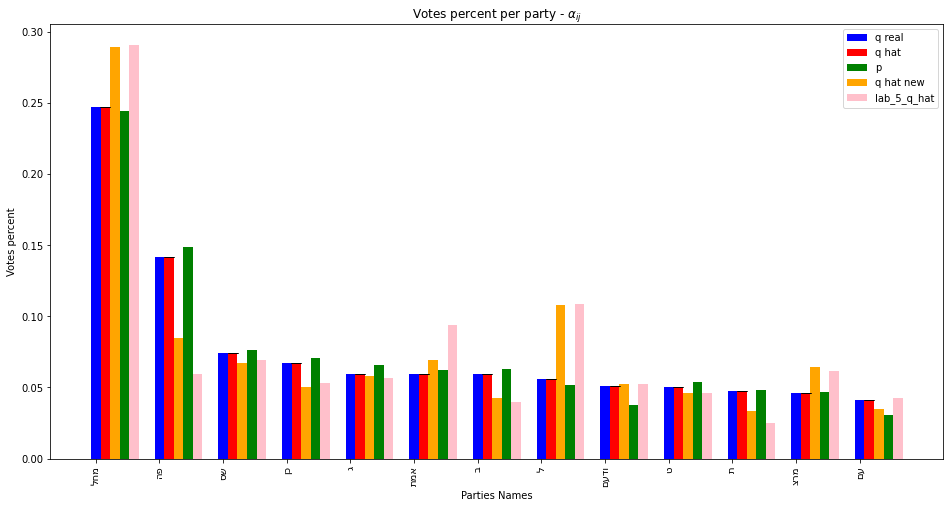

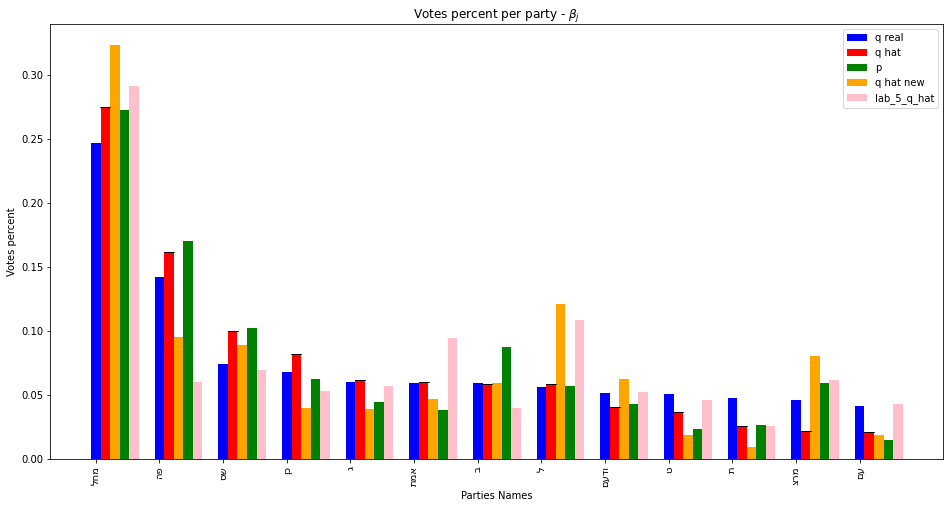

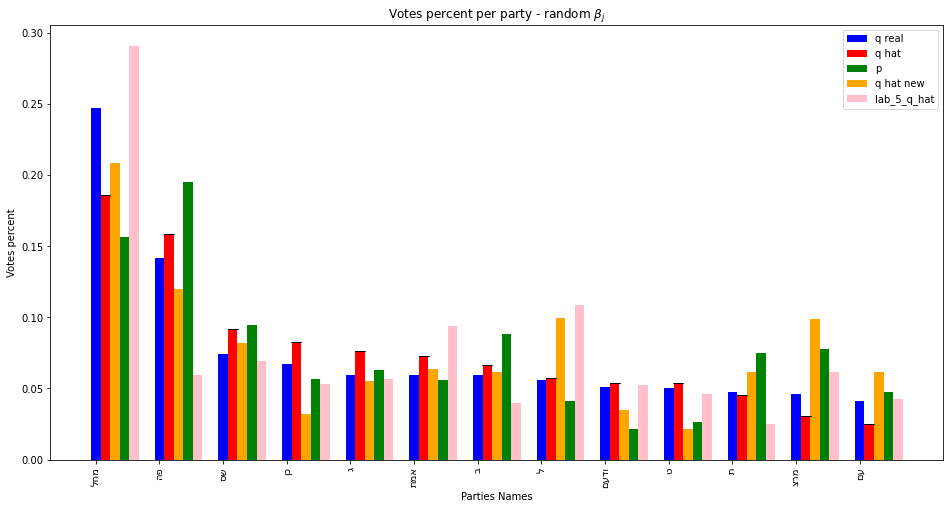

(<Figure size 1152x576 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fbfc4358b50>)

In [ ]:
# Bar plot for a party, only showing values above a certain threshold after fixing:
def party_bar_fix(q_hat_5,q_real, q_hat, p, q_hat_new, error, sim_type):
    width = 0.15  # set column width 
    n = len(total_votes)

    rev_names = [name[::-1] for name in list(names)]
    fig, ax = plt.subplots()  # plt.subplots()
    fig.set_size_inches(16,8)
    q_real_bar = ax.bar(np.arange(n), list(q_real), width, color='b')
    q_hat_bar = ax.bar(np.arange(n)+width, q_hat, width, color='r', yerr=error, capsize=5)
    p_bar = ax.bar(np.arange(n)+3*width, p, width, color='g')
    q_hat_new_bar = ax.bar(np.arange(n)+2*width, q_hat_new, width, color='orange')
    q_hat_lab_5 = ax.bar(np.arange(n)+4*width, q_hat_5, width, color='pink')

    ax.set_ylabel('Votes percent')
    ax.set_xlabel('Parties Names')
    ax.set_title('Votes percent per party - ' + sim_type)
    ax.set_xticks(np.arange(n))
    ax.set_xticklabels(rev_names, rotation=90)
    ax.legend((q_real_bar, q_hat_bar, p_bar,q_hat_new_bar, q_hat_lab_5), ('q real', 'q hat', 'p','q hat new', 'lab_5_q_hat'))
    plt.show()

    return fig, ax

party_bar_fix(mean_q5_alpha,q_real, mean_q_alpha, mean_p_alpha, mean_q_v_new, np.sqrt(var_q_alpha), r'$\alpha_{ij}$')
party_bar_fix(mean_q5_beta,q_real, mean_q_beta, mean_p_beta, mean_q_beta_new, np.sqrt(var_q_beta), r'$\beta_j$')
party_bar_fix(mean_q5_beta_rndm,q_real, mean_q_beta_rndm, mean_p_beta_rndm, mean_q_beta_rndm_new, np.sqrt(var_q_beta_rndm), r'random $\beta_j$')

### Q2

In [ ]:
parties = df.iloc[:,10:].T

In [ ]:
party_names = parties.index.to_list()

In [ ]:
components = PCA(n_components=2).fit_transform(parties)

In [ ]:
normalized_components = PCA(n_components=2).fit_transform(Normalizer().fit_transform(parties))

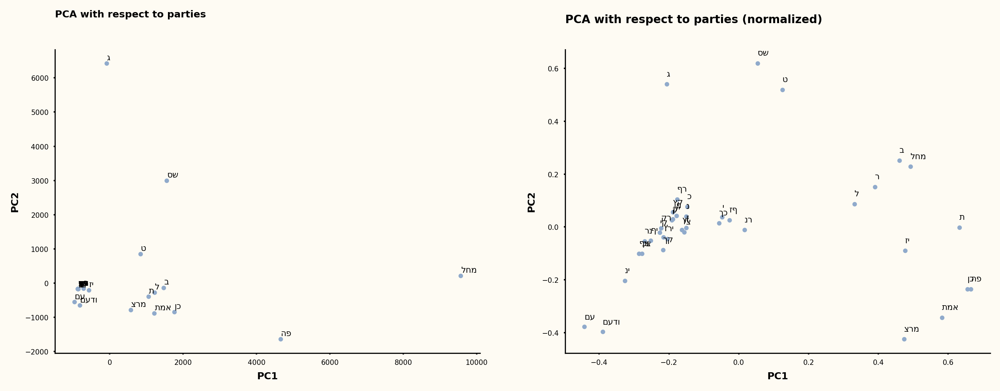

In [ ]:
plt.rcParams['figure.dpi'] = 300
background_color = "#FEFBF3"
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(12,4)
color_map = ['#F2A154', '#90AACB', 'gray', 'darkgray', 'lightgray']


fig.set_facecolor(background_color)
ax1.set_facecolor(background_color)
ax2.set_facecolor(background_color)

for s in ["right", "top"]:
    ax1.spines[s].set_visible(False)
    ax2.spines[s].set_visible(False)

ax1.set_xlabel("PC1",fontsize=7, weight='semibold')
ax1.set_ylabel("PC2",fontsize=7, weight='semibold')
ax1.tick_params(labelsize=5, width=1, length=1)

ax2.set_xlabel("PC1",fontsize=7, weight='semibold')
ax2.set_ylabel("PC2",fontsize=7, weight='semibold')
ax2.tick_params(labelsize=5, width=1, length=1)


x0, x1 = ax1.get_xlim()
y0, y1 = ax1.get_ylim()



ax1.scatter(components[:,0], components[:,1], s=5, color=color_map[1])
x0, x1 = ax1.get_xlim()
y0, y1 = ax1.get_ylim()
ax1.text(x0, y1*1.17, 'PCA with respect to parties', fontsize=7, ha='left', va='top', weight='bold')

ax2.scatter(normalized_components[:,0], normalized_components[:,1], s=5, color=color_map[1])
x0, x1 = ax2.get_xlim()
y0, y1 = ax2.get_ylim()
ax2.text(x0, y1*1.2, 'PCA with respect to parties (normalized)', fontsize=8, ha='left', va='top', weight='bold')

for i, txt in enumerate(party_names):
    ax1.annotate(txt[::-1], (components[i, 0] +11, components[i, 1] + 100), fontsize=6)
    ax2.annotate(txt[::-1], (normalized_components[i, 0], normalized_components[i, 1]+0.03), fontsize=6)



plt.show()

We can see that normalizing our data make it easier to interpert realtions between the partiets.
Firstly, we can sport that all of the parties that didin't make it thourgh to the the knesset are all clustered together. In the Election X percent of the votes were ditributed whithin the 13 bigges partis, hence, the rest are commouly sharing the lack of voting support which can explain their closnes.
If we will try interpert the two main component meaning we can suggest PC2 to be the span of political side e.g. lower values correlates with a left wing parties, like Meret'z and Reshima Meshutefet while higher values correalted with the right wing partis Like Shas and Yehadut Hatorrha.
PC1 ia harder to guess but we can see Meretz and Emet having the highest values while the Arab parties the lowest.


In [ ]:
eshkol_df = pd.read_excel("https://raw.githubusercontent.com/yonatanlou/study_projects/main/Statistics_lab/eshkol_hevrati_calcali.xlsx")
eshkol_df.set_index("set_code", inplace=True)

In [ ]:
big_df = df.join(eshkol_df, on="סמל ישוב")
ballots = big_df.iloc[:, 10:49]
eco = big_df.iloc[:,-1] 




In [ ]:
party_color_map= {'אמת': '#E0BBE4',
 'ב': '#2D5875',
 'ג': '#CFFFD2',
 'ודעם': '#FD7055',
 'ט': '#AFF0C3',
 'כן': '#906297',
 'ל': '#183693',
 'מחל': '#603C69',
 'מרצ': '#D291BC',
 'עם': '#FEA957',
 'פה': '#FEC8D8',
 'שס': '#3bb47e',
 'ת': '#023553'}

party_color_map = {parties_dict[key][::-1]:party_color_map[key] for key in party_color_map.keys()}


party_colors = [party_color_map.get(parties_dict[i][::-1]) if i in parties_dict else "#E0BBE4" for i in ballots.idxmax(axis=1).values]


In [ ]:
eco_colors_map = {
    "1": "#FFE4B5",
    "2": "#F4A460",
    "3":"#FFA500",
    "4":"#FF8C00",
    "5":"#D2691E",
    "6":"#B22222",
    "7":"#DA70D6",
    "8":"#7B68EE",
    "9":"#8A2BE2",
    "10":"#663399"
}

eco_colors = [eco_colors_map.get(str(i)) or "#7B68EE" for i in eco.values.astype(int)] 

In [ ]:
colors = {"ECO": eco_colors, "PARTY":party_colors}
colors_map = {"ECO": eco_colors_map, "PARTY":party_color_map}

In [ ]:
normalized_components = PCA(n_components=2).fit_transform(Normalizer().fit_transform(ballots))

In [ ]:
pca_df = pd.DataFrame(np.c_[normalized_components, eco])

pca_df.columns = ["PC1", "PC2", "ECO"]

In [ ]:
def create_pca_fig(colors, color_map, title, legend_title):
  plt.rcParams['figure.dpi'] = 200
  fig, ax2 = plt.subplots()
  fig.set_size_inches(6,3)

  fig.set_facecolor(background_color)
  ax2.set_facecolor(background_color)
  for s in ["right", "top"]:
      ax2.spines[s].set_visible(False)

  ax2.set_xlabel("PC1",fontsize=7, weight='semibold')
  ax2.set_ylabel("PC2",fontsize=7, weight='semibold')
  ax2.tick_params(labelsize=5, width=1, length=1)

  legend_elements = []
  for i in color_map:
    obj = Line2D([0], [0], marker='o', color='w', label=i, markerfacecolor=color_map[i], markersize=4)
    legend_elements.append(obj)


  ax2.scatter(normalized_components[:,0], normalized_components[:,1], s=2, c=colors, alpha=0.7)
  x0, x1 = ax2.get_xlim()
  y0, y1 = ax2.get_ylim()
  ax2.legend(handles=legend_elements, loc='lower right', fontsize=5, title=legend_title, title_fontsize=5)
  ax2.text(x0, y1*1.2, title, fontsize=7, ha='left', va='top', weight='bold')
  plt.show()

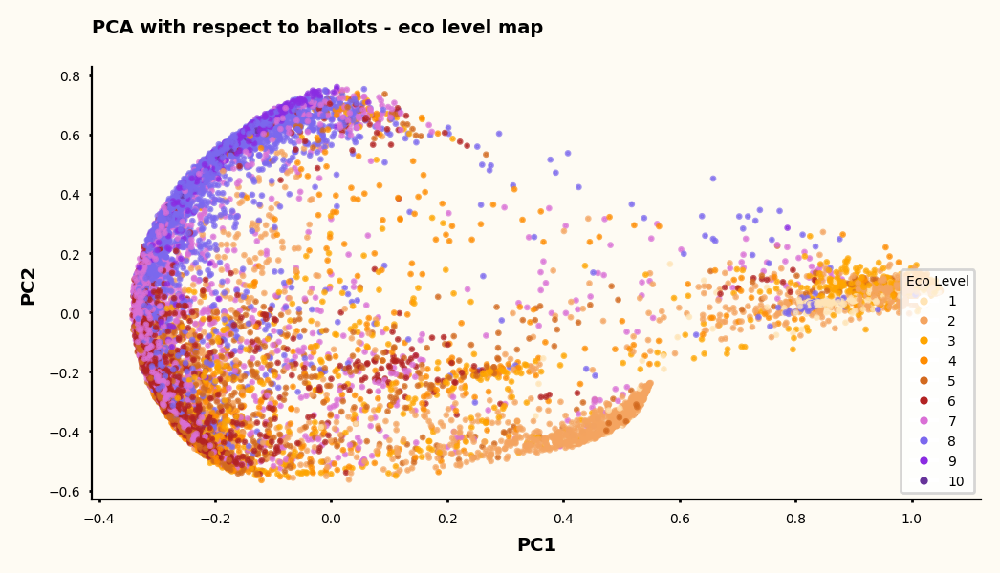

In [ ]:
create_pca_fig(eco_colors, eco_colors_map, "PCA with respect to ballots - eco level map", "Eco Level")

In [ ]:
We can see... 

SyntaxError: ignored

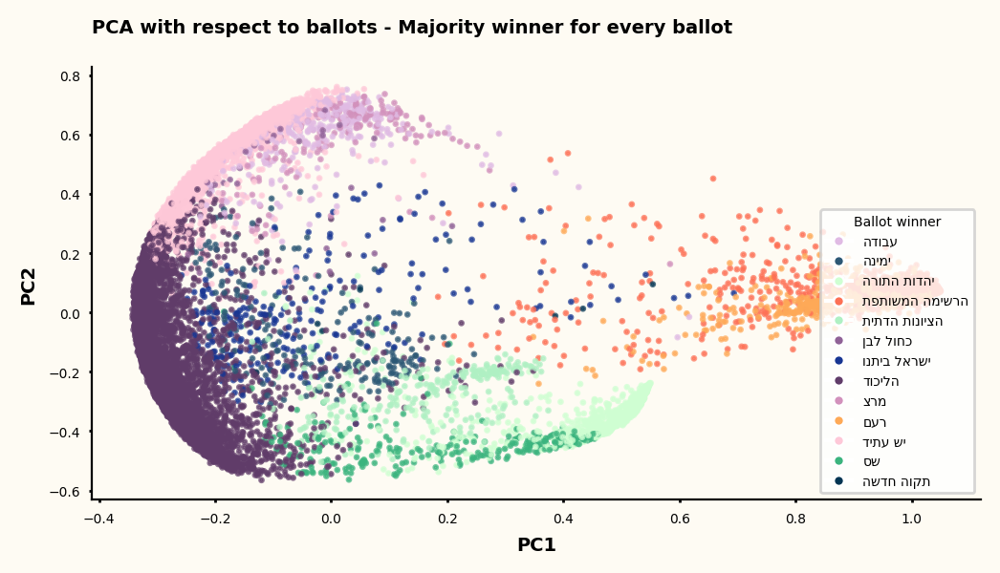

In [ ]:
create_pca_fig(party_colors, party_color_map, "PCA with respect to ballots - Majority winner for every ballot", "Ballot winner")

Q4 B

In [ ]:
p = df[names]

In [ ]:
from matplotlib import cm

In [ ]:
df = df.iloc[:,10:]

In [ ]:
probs = ((df.T/df.T.sum()).T)[names] # voting ratio for each ballot

In [ ]:
plt.rcParams['figure.dpi'] = 300
fig, axs = plt.subplots(4,4, sharex=True, sharey=True,figsize=(25,25))
# fig.set_size_inches(30,25)
fig.set_facecolor(background_color)
fig.text(0.5, -0.04, 'PC1', ha='center' , fontsize=20, weight='semibold')
fig.text(-0.05, 0.5, 'PC2', va='center', rotation='vertical',fontsize=20, weight='semibold')
plt.tight_layout()

for i in range(13):
  party = probs.iloc[:, i].name
  for s in ["right", "top"]:
    axs[i//4, i%4].spines[s].set_visible(False)

  axs[i//4, i%4].set_facecolor(background_color)
  axs[i//4, i%4].scatter(normalized_components[:,0], normalized_components[:,1], s=4, c=probs.iloc[:, i], cmap='Reds')
  axs[i//4, i%4].text(x0+0.2, y1*1.2, parties_dict[party][::-1], fontsize=15, ha='left', va='top', weight='bold')

fig.delaxes(axs[3,1])
fig.delaxes(axs[3,2])
fig.delaxes(axs[3,3])

fig.suptitle('Ballots PCA colored with respect to each party support', fontsize=30, weight='semibold', y=1.08)
plt.show()
